<a href="https://colab.research.google.com/github/Anita-desire/Cats-Dogs/blob/main/Cata_%26_Dogs_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Cats and Dogs Classification CNN Model**

##**Install Kaggle and prerequisites**

In [1]:
!pip install kaggle

**linking the my kaggle account with the json file**

In [2]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

**Importing tha kaggle data set**

In [3]:
#Importing tha kaggle data set
!kaggle competitions download -c dogs-vs-cats

100% 812M/812M [00:07<00:00, 109MB/s] 
100% 812M/812M [00:07<00:00, 116MB/s]


In [4]:
!ls

dogs-vs-cats.zip  kaggle.json  sample_data


### **extracting the compressed dataset**

In [5]:
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/dogs-vs-cats.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [6]:
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/train.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [7]:
import os
# counting the number of files in train folder
path, dirs, files = next(os.walk('/content/train'))
file_count = len(files)
print('Number of images: ', file_count)

Number of images:  25000


**Printing the names of images**

In [8]:
file_names = os.listdir('/content/train/')
print(file_names)

['cat.4257.jpg', 'dog.10760.jpg', 'cat.2234.jpg', 'dog.4161.jpg', 'dog.3025.jpg', 'dog.46.jpg', 'cat.10180.jpg', 'dog.10849.jpg', 'dog.4568.jpg', 'cat.515.jpg', 'dog.4486.jpg', 'cat.8303.jpg', 'dog.9015.jpg', 'dog.4783.jpg', 'cat.6694.jpg', 'cat.11687.jpg', 'dog.3596.jpg', 'dog.12456.jpg', 'cat.11398.jpg', 'cat.8094.jpg', 'dog.8912.jpg', 'dog.10193.jpg', 'dog.1832.jpg', 'dog.8091.jpg', 'cat.3385.jpg', 'dog.10170.jpg', 'cat.10237.jpg', 'cat.8046.jpg', 'dog.4148.jpg', 'cat.5693.jpg', 'cat.3596.jpg', 'cat.2525.jpg', 'cat.11284.jpg', 'cat.7095.jpg', 'dog.8742.jpg', 'dog.6887.jpg', 'dog.3867.jpg', 'cat.686.jpg', 'cat.10243.jpg', 'dog.11117.jpg', 'cat.4754.jpg', 'cat.12185.jpg', 'cat.6069.jpg', 'dog.11975.jpg', 'cat.2885.jpg', 'dog.5902.jpg', 'cat.2196.jpg', 'dog.10632.jpg', 'dog.6745.jpg', 'cat.11386.jpg', 'cat.4721.jpg', 'dog.4358.jpg', 'dog.7854.jpg', 'dog.8383.jpg', 'dog.8092.jpg', 'cat.6721.jpg', 'dog.6842.jpg', 'cat.10151.jpg', 'dog.6445.jpg', 'cat.8611.jpg', 'cat.1300.jpg', 'dog.5094.

###**Importing the Dependencies**

In [13]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

###**Displaying the images of dogs and cats**

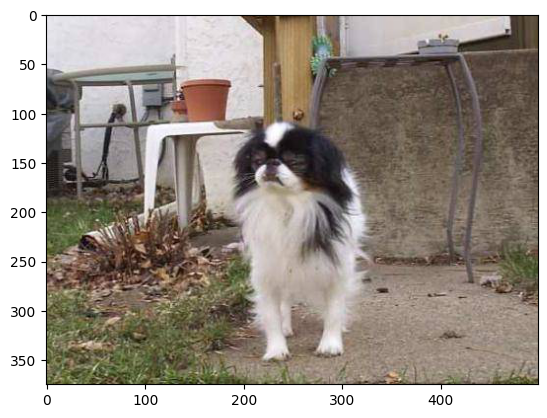

In [14]:
# display dog image
img = mpimg.imread('/content/train/dog.8297.jpg')
imgplt = plt.imshow(img)
plt.show()

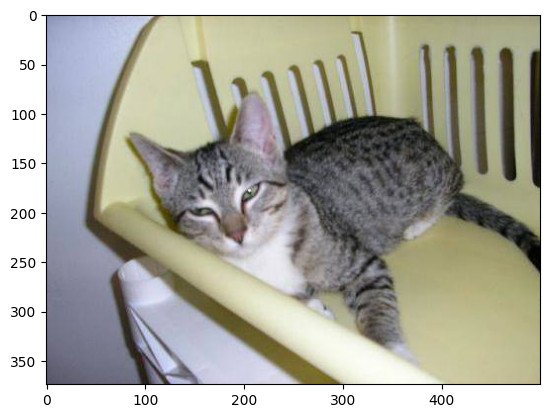

In [16]:
img = mpimg.imread('/content/train/cat.3788.jpg')
imgplt = plt.imshow(img)
plt.show()

###**To Count no of dogs and cat images are there**

Observe that the data set contains dog images with dog.number.jpg and cat images with cat.number.jpg

In [18]:
#So find the no of cat and dog images we will run the for loop below
file_names = os.listdir('/content/train/')

dog_count = 0
cat_count = 0

for img_file in file_names:

  name = img_file[0:3]

  if name == 'dog':
    dog_count += 1

  else:
    cat_count += 1

print('Number of dog images =', dog_count)
print('Number of cat images =', cat_count)

Number of dog images = 12500
Number of cat images = 12500


###**Resize the Images to a fixed size**

In [ ]:
#creating a directory for resized images
os.mkdir('/content/image resized')

In [24]:
original_folder = '/content/train/'
resized_folder = '/content/image resized/'

for i in range(2000):

  filename = os.listdir(original_folder)[i]
  img_path = original_folder+filename

  img = Image.open(img_path)
  img = img.resize((224, 224))
  img = img.convert('RGB')

  newImgPath = resized_folder+filename
  img.save(newImgPath)

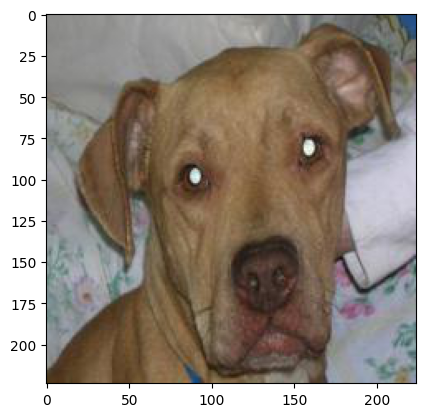

In [28]:
# display resized dog image
img = mpimg.imread('/content/image resized/dog.10204.jpg')
imgplt = plt.imshow(img)
plt.show()

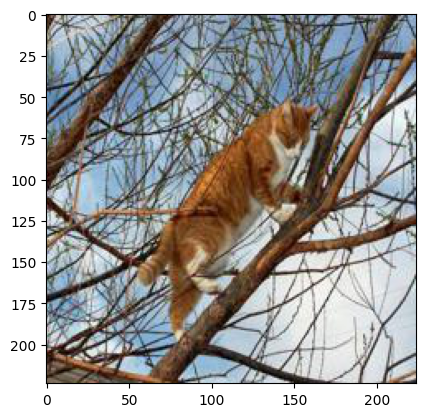

In [29]:
# display resized cat image
img = mpimg.imread('/content/image resized/cat.9512.jpg')
imgplt = plt.imshow(img)
plt.show()

**Creating labels for resized images of dogs and cats**

For training data, we use these labels.

*   Cat-->0
*   Dog-->1



In [30]:
# creaing a for loop to assign labels
filenames = os.listdir('/content/image resized/')


labels = []

for i in range(2000):

  file_name = filenames[i]
  label = file_name[0:3]

  if label == 'dog':
    labels.append(1)

  else:
    labels.append(0)

In [31]:
print(filenames[0:5])
print(len(filenames))

['cat.4257.jpg', 'dog.10760.jpg', 'cat.2234.jpg', 'dog.4161.jpg', 'dog.3025.jpg']
2000


In [32]:
print(labels[0:5])
print(len(labels))

[0, 1, 0, 1, 1]
2000


In [33]:
# counting the images of dogs and cats out of 2000 images
values, counts = np.unique(labels, return_counts=True)
print(values)
print(counts)

[0 1]
[ 984 1016]


**Converting all the resized images to numpy arrays**

In [34]:
import cv2
import glob

In [36]:
image_directory = '/content/image resized/'
image_extension = ['png', 'jpg']

files = []

[files.extend(glob.glob(image_directory + '*.' + e)) for e in image_extension] #glob is used to search the directory

dog_cat_images = np.asarray([cv2.imread(file) for file in files]) # now all files in numpy array and they are there in single numpy array

In [37]:
print(dog_cat_images)

[[[[166 190 248]
   [165 189 247]
   [164 188 246]
   ...
   [ 98 140 205]
   [130 171 234]
   [152 191 253]]

  [[169 193 251]
   [167 191 249]
   [166 190 248]
   ...
   [ 93 137 201]
   [125 166 229]
   [151 190 252]]

  [[171 195 253]
   [169 193 251]
   [167 191 249]
   ...
   [ 87 130 197]
   [116 156 221]
   [145 186 249]]

  ...

  [[183 136 109]
   [188 141 114]
   [181 136 109]
   ...
   [126  84  61]
   [126  84  61]
   [127  85  62]]

  [[185 138 111]
   [185 138 111]
   [182 135 108]
   ...
   [126  83  62]
   [124  81  60]
   [127  84  63]]

  [[184 137 110]
   [176 129 102]
   [174 127 100]
   ...
   [130  87  66]
   [119  76  55]
   [121  78  57]]]


 [[[156 198 191]
   [141 185 178]
   [136 187 179]
   ...
   [ 60 117 132]
   [ 50 109 125]
   [ 50 108 127]]

  [[166 208 201]
   [137 181 174]
   [130 181 173]
   ...
   [ 56 111 124]
   [ 48 104 121]
   [ 53 109 126]]

  [[177 220 211]
   [138 183 174]
   [129 181 171]
   ...
   [ 49 101 114]
   [ 47  99 115]
   [ 58 110

In [38]:
type(dog_cat_images)

numpy.ndarray

In [39]:
print(dog_cat_images.shape)

(2000, 224, 224, 3)


###**Train Test Split**

In [40]:
X = dog_cat_images
Y = np.asarray(labels)

In [41]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2) #20% test data

In [42]:
print(X.shape, X_train.shape, X_test.shape) #Printing the shapes of data

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


So now we can see we have :

**Training images --> 1600 Testing images ---> 400**

***Scaling the data***

In [43]:
# scaling the data
X_train_scaled = X_train/255

X_test_scaled = X_test/255

In [44]:
print(X_train_scaled)

[[[[0.16862745 0.30980392 0.45098039]
   [0.16470588 0.30588235 0.44705882]
   [0.16470588 0.30980392 0.44313725]
   ...
   [0.25098039 0.41568627 0.58431373]
   [0.29411765 0.43921569 0.61176471]
   [0.28235294 0.41960784 0.59215686]]

  [[0.16862745 0.30980392 0.45098039]
   [0.16470588 0.30588235 0.44705882]
   [0.16470588 0.30980392 0.44313725]
   ...
   [0.25098039 0.41568627 0.58431373]
   [0.29803922 0.44313725 0.61568627]
   [0.28235294 0.41960784 0.59215686]]

  [[0.16862745 0.30980392 0.45098039]
   [0.16470588 0.30588235 0.44705882]
   [0.16470588 0.30980392 0.44313725]
   ...
   [0.25490196 0.41960784 0.58823529]
   [0.29803922 0.44313725 0.61568627]
   [0.28627451 0.42352941 0.59607843]]

  ...

  [[0.57254902 0.57647059 0.56078431]
   [0.57647059 0.58039216 0.56470588]
   [0.58039216 0.58431373 0.56862745]
   ...
   [0.30980392 0.4745098  0.61960784]
   [0.29803922 0.4627451  0.60784314]
   [0.29411765 0.45882353 0.60392157]]

  [[0.57254902 0.58039216 0.55686275]
   [0.5

###**Building the Neural Network**

So here we are using **Transfer learning**
We are using the model which is already trained and we are using that for this particular use case

**The architecture of Mobilenet V2**


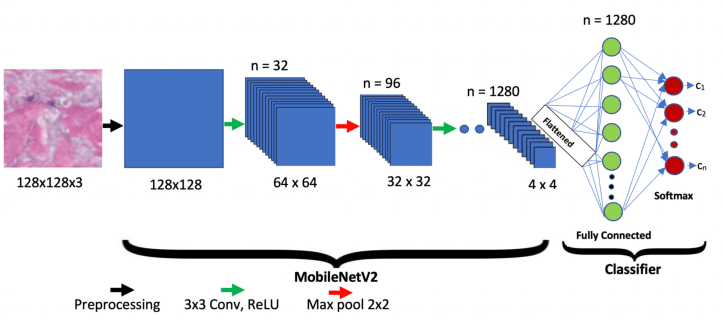


In [45]:
import tensorflow as tf
import tensorflow_hub as hub

In [48]:
mobilenet_model = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'  #Importing the mobilenet_model using the url

pretrained_model = hub.KerasLayer(mobilenet_model, input_shape=(224,224,3), trainable=False) #KerasLayer will download the mobilenet_model



In [49]:
num_of_classes = 2

model = tf.keras.Sequential([

    pretrained_model,
    tf.keras.layers.Dense(num_of_classes)

])

model.summary() #Tells what layers do we have etc.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 2)                 2562      
                                                                 
Total params: 2,260,546
Trainable params: 2,562
Non-trainable params: 2,257,984
_________________________________________________________________


In [50]:
model.compile(
    optimizer = 'adam',
    loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics = ['acc']
) #We are compiling it using optimizer and loss function along with metrics as accuarcy

In [51]:
model.fit(X_train_scaled, Y_train, epochs=5)

Epoch 1/5
50/50 [==============================] - 60s 1s/step - loss: 0.2440 - acc: 0.8931
Epoch 2/5
50/50 [==============================] - 57s 1s/step - loss: 0.0874 - acc: 0.9706
Epoch 3/5
50/50 [==============================] - 57s 1s/step - loss: 0.0662 - acc: 0.9756
Epoch 4/5
50/50 [==============================] - 57s 1s/step - loss: 0.0516 - acc: 0.9850
Epoch 5/5
50/50 [==============================] - 55s 1s/step - loss: 0.0449 - acc: 0.9862


In [52]:
score, acc = model.evaluate(X_test_scaled, Y_test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

13/13 [==============================] - 14s 1s/step - loss: 0.0663 - acc: 0.9775
Test Loss = 0.06630966812372208
Test Accuracy = 0.9775000214576721


 **We can see from above that the accuracy of our model for the data set is 97%**

 So initially in the first epoch the accuracy was 89% ,next 97 ,next 97,next 98 ,next 98 and finally the Test Accuracy is 97%.

###**Predictive System**

Path of the image to be predicted: /content/Dog_Breeds.jpg


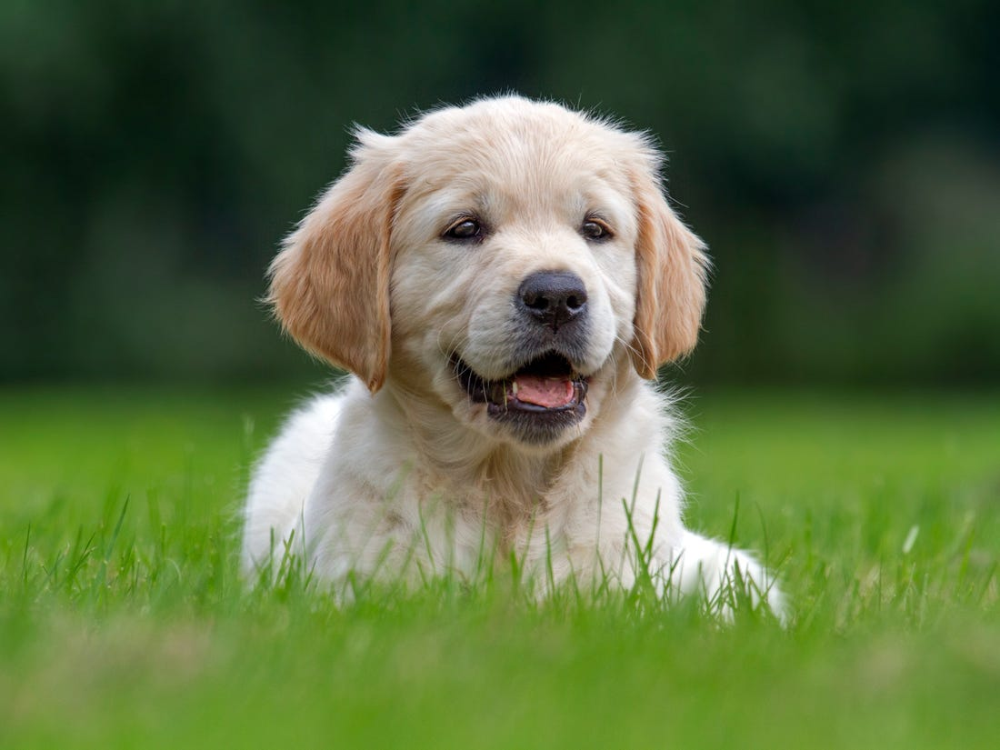

1/1 [==============================] - 1s 602ms/step
[[-5.0310974  4.677501 ]]
1
The image represents a Dog


In [53]:
input_image_path = input('Path of the image to be predicted: ') #Here you can download the random dog / cat image from the net and test on the model.
input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')

Path of the image to be predicted: /content/cat.jpg


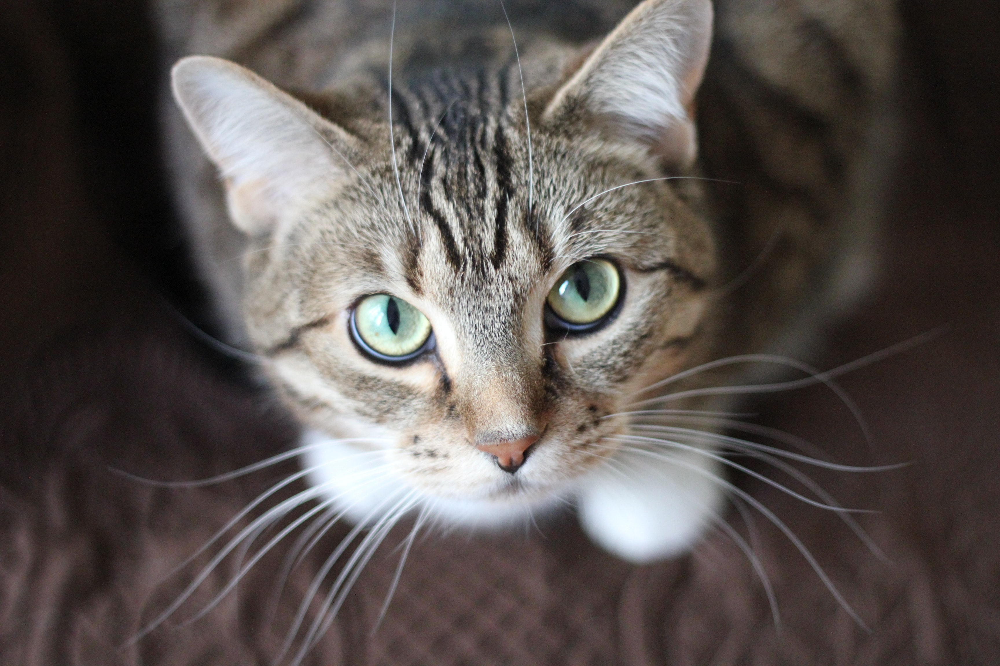

1/1 [==============================] - 0s 88ms/step
[[ 4.489163 -2.49359 ]]
0
The image represents a Cat


In [54]:
input_image_path = input('Path of the image to be predicted: ') #Here you can download the random dog / cat image from the net and test on the model.
input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)

print(input_pred_label)

if input_pred_label == 0:
  print('The image represents a Cat')

else:
  print('The image represents a Dog')